# Cost Function - Polygons

First let's draw polygons on image

In [2]:
from matplotlib.pyplot import imshow
import matplotlib.pyplot as plt
import numpy as np
import PIL.ImageDraw as ImageDraw
import PIL.Image as Image

In [117]:
# Calculates difference between two images. It done subtracting one image from another.
# img1 and img2 are images in numpy array format.
def abs_error(img1, img2):
    return np.sum(np.abs(img1.astype("int32") - img2.astype("int32")))

def square_error(img1, img2):
    return np.sum(np.square(img1.astype("int64") - img2.astype("int64")))

In [48]:
np.sum(np.square(orig_mat[:3,:3].astype("int32") - orig_mat[3:6,3:6].astype("int32")))

6085

In [37]:
# Generates image from polygons
    #size - image height and width
    #polygons - list of polygons, in shape [[R,G,B,A,X0,Y0, ..., Xn, Yn], 

def gen_image_poly(size, polygons):

    image = Image.new("RGB", size, (255,255,255,0))
        
    draw = ImageDraw.Draw(image, mode="RGBA")

    nr_vertex = (len(polygons[0]) - 4)//2 # TODO make it better

    for pol in polygons:
        fill = np.concatenate([pol[:3], [pol[3]]]) # Scale fill between 0 to 100.
        fill = tuple(map(int, fill))  # Make R,G,B to ints and leave alpha as it is
        points = np.reshape(pol[4:], newshape=(nr_vertex,2))  # TODO number of vertices must be known?
        points = tuple(map(tuple, points))
        draw.polygon(points, fill= fill)
    
    img_mat = np.array(image)

    del image
    del draw

    return img_mat
#image
#np.asarray(image).shape

In [118]:
# Cost function for using polygons
    # orig_mat - original image given as matrix
    # nr_poly - number of polygons used
    # params - information about polygons in 1-D array (R,G,B,A,x0,y0,...,xn,yn)

def cost_poly(params, orig_mat, nr_poly):
    
    polygons = np.split(params, nr_poly)
    size = tuple(reversed(orig_mat.shape[:2])) # W and H of image
    
    new_mat = gen_image_poly(size = size, polygons = polygons)
        
    return square_error(orig_mat, new_mat)

## Test cost function

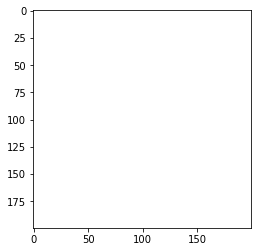

In [8]:
polygons_txt = "2 0 5 0.9886052134148646 98 151 161 200 199 1 52 0 116 117 24 189 3 5 9 0.9994804367888221 57 145 5 0 198 1 147 11 200 188 199 198 255 254 252 0.9915305913286963 187 171 132 6 16 40 109 45 93 2 18 57 254 254 254 0.9988951206026371 172 199 199 172 137 19 200 31 17 40 139 15 69 24 56 0.12523059242208978 192 12 108 32 196 76 101 134 82 40 175 110 33 15 49 0.8511456315478534 158 199 172 67 7 86 197 17 181 167 122 195 2 10 10 0.9948295021512059 24 176 9 125 43 27 183 163 101 45 49 52 66 80 80 0.4493670272179049 25 200 185 128 182 124 33 9 49 25 74 128 22 12 26 0.3400040422356272 91 195 83 20 6 97 186 70 29 146 56 5 0 0 0 0.001 55 195 194 80 111 68 128 49 134 12 56 106 253 253 253 0.9057830752878273 165 54 2 97 67 20 48 89 162 22 155 104 10 8 13 0.9359471533611046 121 1 198 0 160 79 150 52 36 145 188 60 33 31 34 0.874288723450827 141 33 172 145 199 11 200 199 188 200 44 135 4 3 8 0.7577250731780771 197 193 44 146 35 197 177 139 148 198 23 58 9 9 9 0.9523490773409384 73 144 15 95 0 1 0 200 200 200 160 168 199 189 201 0.23982702450414806 184 17 200 172 62 69 119 199 115 35 175 111 60 63 54 0.2886550304159803 183 197 200 2 6 0 153 146 166 137 154 179 1 1 1 0.8386418505500401 74 41 27 90 199 144 200 17 132 148 153 82 4 2 3 0.4738645882993977 4 68 196 145 156 37 174 162 83 187 49 66 67 61 63 0.2645318406110364 188 144 145 29 108 39 24 44 124 76 154 63 123 130 124 0.2185319329772073 69 13 167 172 131 176 148 30 10 110 49 199 242 242 240 0.9899702077880892 167 92 100 197 96 4 124 5 39 172 23 130 9 4 8 0.9201817598711366 154 103 200 0 200 129 116 153 130 149 118 169 27 20 25 0.40342505854185506 39 190 1 138 66 89 103 29 157 133 185 61 233 236 230 0.298637912970688 31 95 158 131 28 160 166 140 115 2 97 65 8 1 5 0.239427367542574 55 28 183 106 46 121 143 58 197 80 138 38 10 6 9 0.9038660536497067 192 14 147 17 200 146 116 171 187 161 191 129 1 3 1 0.8285458216013213 97 185 67 97 62 58 119 75 56 88 141 89 36 36 36 0.520175048784786 151 107 124 56 200 199 43 200 46 187 197 167 32 31 33 0.9956105846866175 140 200 117 186 53 131 41 47 2 11 65 200 19 19 19 0.9981913327632532 3 176 66 5 0 0 4 198 150 60 84 149 16 17 16 0.9744062308876296 131 89 189 119 158 102 89 78 11 169 2 97 178 230 191 0.06663820046394742 74 200 66 14 103 0 200 18 199 174 118 139 248 240 248 0.3065733746415329 180 84 134 5 66 22 28 180 144 127 163 54 2 0 2 0.4098868623072611 119 145 149 89 116 134 97 199 54 107 18 70 18 17 17 0.5099138397841425 11 183 12 164 199 197 200 0 200 182 167 196 255 254 253 0.15156859121384736 97 1 103 172 192 161 121 66 167 69 39 68 0 0 0 0.001 101 21 127 30 141 26 126 91 98 7 37 129 234 228 232 0.22785085392551485 131 175 36 195 64 18 118 0 136 90 147 30 220 220 220 0.3357030932024738 63 154 76 60 94 136 172 133 34 32 126 78 20 18 20 0.44227026980717765 2 7 92 132 81 69 56 64 45 118 24 174 23 29 25 0.2350174616893832 93 140 181 167 142 176 44 34 83 0 13 89 203 207 201 0.24011583166836892 126 151 140 149 34 183 49 104 129 97 72 102 0 0 0 0.001 85 109 10 194 56 121 40 126 11 156 111 53 15 14 14 0.38262537272354913 85 63 108 144 88 168 101 116 26 17 8 106 20 26 21 0.12105250835394599 118 199 83 123 96 199 153 116 36 70 174 34 0 17 2 0.048843922033566356 118 1 109 75 85 179 31 96 96 96 43 64 228 226 228 0.35800327879825367 97 167 112 165 126 115 131 40 39 159 131 134 66 67 67 0.2697182498643409 123 37 47 153 39 173 43 152 114 86 92 64 0 0 0 0.001 102 181 195 192 99 43 81 134 6 82 199 197"

polygons = polygons_txt.split()
polygons_array = np.array(list(map(float, polygons)))
nr_pols = 50

polygons = np.split(polygons_array, nr_pols)

new_img = gen_image_poly((200,200), polygons)

plt.imshow(new_img, interpolation='nearest')
plt.show()

# ATM does not work, cause alpha in range of (0,1) should be (0,100)

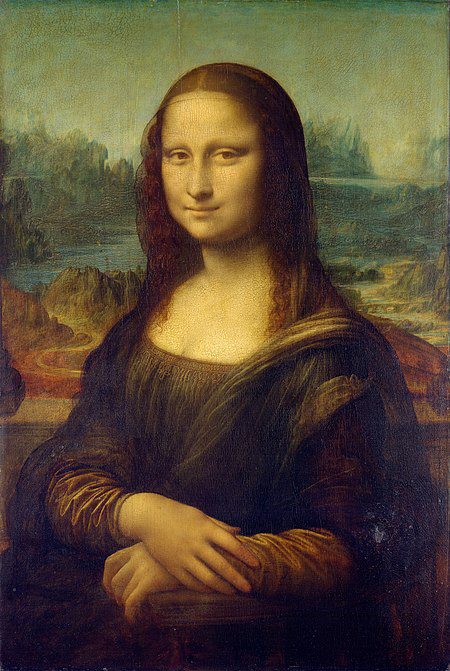

In [9]:
mona_lisa = Image.open("mona_lisa.jpg")
mona_lisa

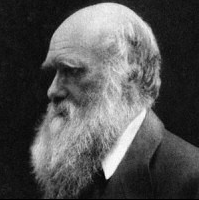

In [10]:
darwin = Image.open("darwin.png").convert("RGB")
darwin

In [71]:
orig_mat = np.array(mona_lisa)
print(orig_mat.shape)
cost_poly(polygons_array, orig_mat, 50)

(671, 450, 3)


166823353

In [70]:
orig_mat = np.array(darwin)
cost_poly(polygons_array, orig_mat, 50)

20676969

In [73]:
20676969/(200*199*3*255)

0.6791135087200709

## Try differential evolution

In [89]:
from scipy.optimize import differential_evolution

Function to get easily the bounds of parameters.

In [90]:
# Return bounds based on image size and number of polygons and vertices
    # nr_poly - number of polygons
    # nr_vertex - number of vertices for each polygon
    # size - (width, height)
    # rgb_range - default RGB range
    # alpha_range - default alpha range
def get_bounds(nr_poly, nr_vertex, size, rgb_range = [0,255], alpha_range = [0,100]):
    
    w_range = [1, size[0]]
    h_range = [1, size[1]]
    
    polygon = 3*[rgb_range] + [alpha_range] + nr_vertex*[w_range, h_range]
    bounds = nr_poly*polygon
    
    return bounds

In [92]:
nr_poly = 5
nr_vertex = 3
size = tuple(reversed(orig_mat.shape[:2])) # W and H of image
bounds = get_bounds(nr_poly, nr_vertex, size)
print(size)
len(bounds)

(199, 200)


50

In [96]:
res = differential_evolution(cost_poly, bounds, args = (orig_mat, nr_poly), maxiter=100, popsize=15)

In [97]:
polygons = np.split(res.x, nr_poly)

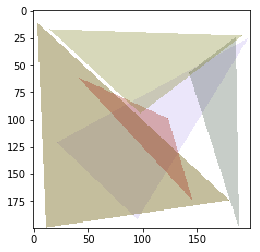

In [98]:
new_img = gen_image_poly(size, polygons)

plt.imshow(new_img)
plt.show()

In [355]:
res

     fun: 12740290.0
 message: 'Optimization terminated successfully.'
    nfev: 4271
     nit: 1
 success: True
       x: array([ 235.73843832,   39.01473457,  170.02697531,   92.79521346,
        131.51491263,   43.61884704,   15.98942881,   69.04863655,
         73.29044723,   19.71564387,    3.02439411,   20.39403712,
         69.97836373,  146.12548534,   98.48339801,  212.27306351,
        199.45287766,   76.30545564,  138.70535651,   89.73147557,
        130.96573296,   77.82751284,  101.04566116,  107.83834307,
        172.67296836,   41.72511164,  170.21511986,   97.7578882 ,
         21.5099158 ,  100.91741198,  229.47040901,   44.46096171,
         89.75256263,  144.9645345 ,  159.64311218,   29.65314098,
        183.12763022,  113.81997462,  136.06309455,  115.63918078,
         33.44524583,  141.85633722,  162.89713465,    8.66395123,
        200.8583989 ,   13.21371094,  103.52604183,  134.24870191,
         27.40532392,  112.46951331,  162.94475442,   84.74564469,
      

### Hill-climbing/ Simulated Annealing

In [74]:
from random import randint, choice, random

In [75]:
# Generate new population randomly based on the bounds
    # bounds - bounds for each parameter of polygon
    # popsize - population size
    # nr_poly - number of polygons
    # nr_vertex - number of vertices

def popul_from_bounds(bounds, popsize, nr_poly, nr_vertex):
    
    population = []
    
    nr_params = 4 + 2*nr_vertex  # 4 - RGBA and then X,Y for vertices
    
    for i in range(0, popsize):
        indv = []

        for j in range(nr_poly):
            polygons = []
            for k in range(nr_params):
                polygons.append(randint(bounds[k][0],bounds[k][1]))
            indv.append(polygons)
        population.append(indv)
        
    return population

In [76]:
popul_from_bounds(bounds=bounds, popsize=1, nr_poly=nr_poly, nr_vertex=nr_vertex)

[[[10, 153, 191, 94, 150, 102, 126, 195, 30, 118, 85, 163, 190, 17],
  [188, 69, 37, 40, 108, 95, 95, 186, 39, 189, 199, 33, 195, 177],
  [38, 223, 145, 18, 83, 156, 177, 46, 154, 45, 140, 85, 166, 106],
  [176, 233, 119, 63, 7, 153, 1, 168, 191, 82, 151, 39, 8, 107],
  [83, 160, 135, 62, 95, 145, 5, 17, 123, 175, 177, 15, 133, 155]]]

In [77]:
def show_img(size, dna):
    new_img = gen_image_poly(size, np.split(dna, nr_poly))
    plt.imshow(new_img)
    plt.show()

In [111]:
randint(bounds[2][0], bounds[2][1])

155

In [132]:
def hill(orig_img, nr_poly, nr_vertex, iter = 10, mut_rate = 0.05, mut_change = 0.05, mut_random = False):
    
    # Get params
    size = tuple(reversed(orig_img.shape[:2])) # W and H of image
    bounds = get_bounds(nr_poly, nr_vertex, size)
    # Init DNA
    dna = popul_from_bounds(bounds, popsize=1, nr_poly=nr_poly, nr_vertex=nr_vertex)[0]  # Only one element in pop, take 1st
    dna = np.array(dna).flatten()
    #print(dna)
    
    cost_last = cost_poly(nr_poly=nr_poly, orig_mat=orig_img, params=dna)
        
    len_dna = len(dna)
    dna_last = dna
    dna_new = dna_last.copy()
    
    impr = 0
    
    for i in range(iter):    
        
        # Select randomly param to change and change it by mutation rate
        idx = randint(0, len_dna - 1)
        direction = choice([-1,1])  # Select randomly the direction
        limits = bounds[idx]  # limits 
        
        if mut_random:
            dna_new[idx] = randint(limits[0], limits[1])
        else:
            #Mutate
            dna_new[idx] = dna_last[idx] + direction*limits[1]*mut_rate
        
        # Quick limits check
        if dna_new[idx] > limits[1]:
            dna_new[idx] = limits[1]
        elif dna_new[idx] < limits[0]:
            dna_new[idx] = limits[0]
        
        # Calculate new cost
        cost_new = cost_poly(nr_poly=nr_poly, orig_mat=orig_img, params=dna_new)
        
        mut = random()
        
        # Compare costs
        if (mut < mut_change)  or (cost_new < cost_last):
            dna_last = dna_new.copy()
            cost_last = cost_new
            impr += 1
        else:
            dna_new = dna_last.copy()
            
        if i % 1000 == 0:
            print("Iteration", i)
            print("improvements", impr)
            fit = cost_last/(255*255*3*size[0]*size[1])
            print("Fit: ", fit)
            show_img(size, dna_last)
        
    
    show_img(size, dna_last)
    return dna_last

Iteration 0
improvements 0


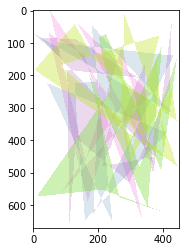

Iteration 1000
improvements 284


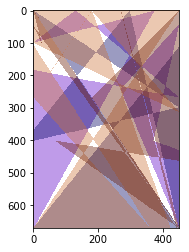

Iteration 2000
improvements 437


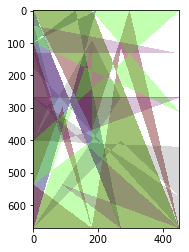

Iteration 3000
improvements 579


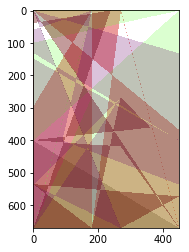

Iteration 4000
improvements 695


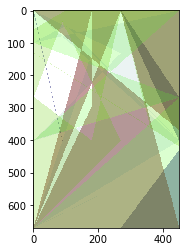

KeyboardInterrupt: 

In [79]:
hill(orig_mat, 10, 6, 10000, mut_rate=0.1)

Iteration 0
improvements 0


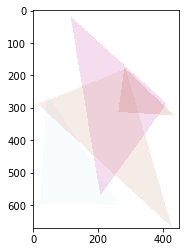

Iteration 1000
improvements 361


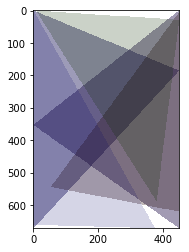

Iteration 2000
improvements 522


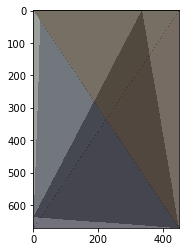

Iteration 3000
improvements 606


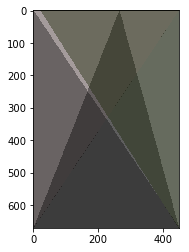

Iteration 4000
improvements 691


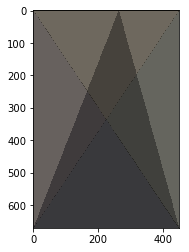

Iteration 5000
improvements 782


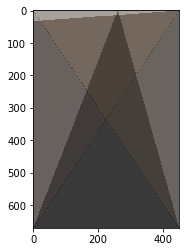

Iteration 6000
improvements 881


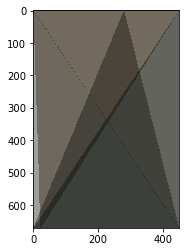

Iteration 7000
improvements 990


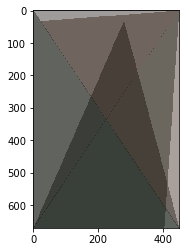

Iteration 8000
improvements 1097


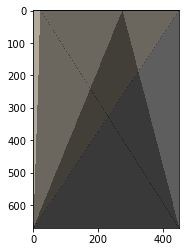

Iteration 9000
improvements 1204


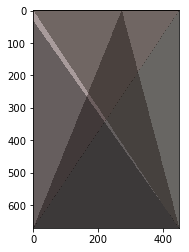

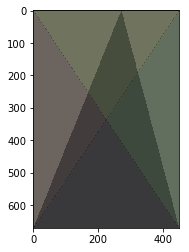

array([ 56,  22,   0, 100,   1, 671, 450,   1,   1,   1,   0,   0,   0,
       100, 449, 671, 450,   1,   1, 671,   0,   0,  12, 100,   1, 670,
       272,   1, 450, 671,  10,  41,   0, 100, 450, 671,   1,   1, 449,
         1,   0,   0,   0, 100,   1,   1, 450, 671,   1, 671])

In [80]:
hill(orig_mat, 5, 3, 10000, mut_rate=0.05)

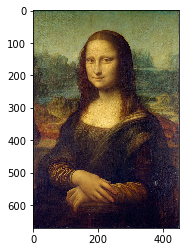

In [83]:
plt.imshow(orig_mat)
plt.show()

Iteration 0
improvements 0


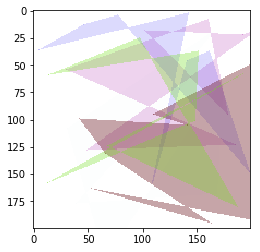

Iteration 1000
improvements 399


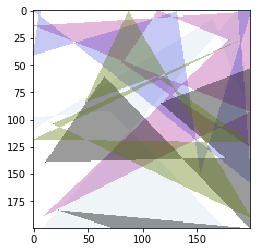

Iteration 2000
improvements 682


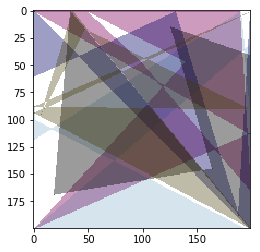

Iteration 3000
improvements 871


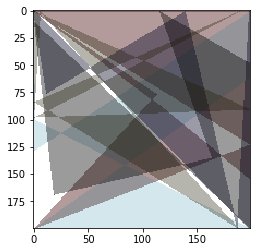

Iteration 4000
improvements 1013


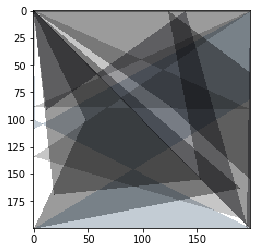

Iteration 5000
improvements 1117


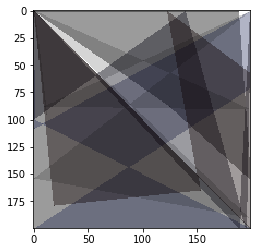

Iteration 6000
improvements 1227


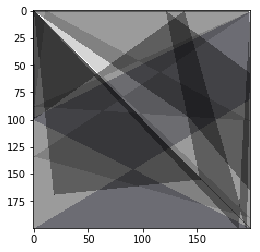

Iteration 7000
improvements 1333


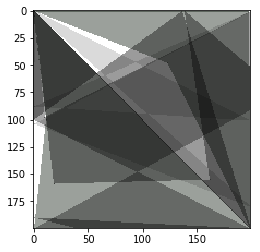

Iteration 8000
improvements 1419


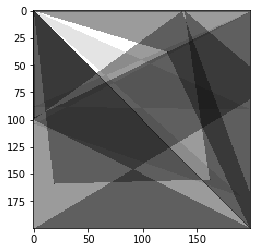

Iteration 9000
improvements 1505


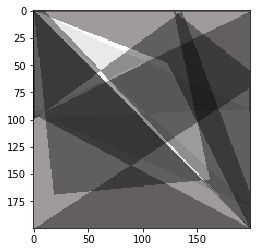

Iteration 10000
improvements 1595


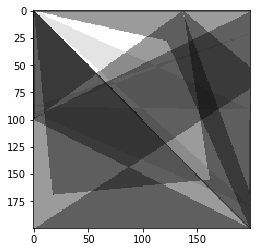

Iteration 11000
improvements 1666


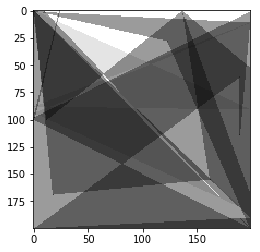

Iteration 12000
improvements 1753


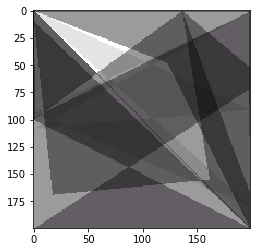

Iteration 13000
improvements 1866


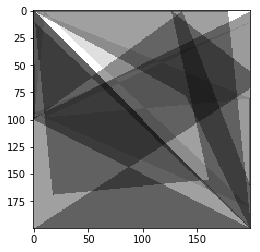

Iteration 14000
improvements 1976


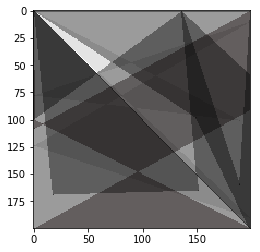

Iteration 15000
improvements 2055


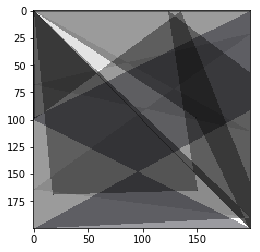

Iteration 16000
improvements 2170


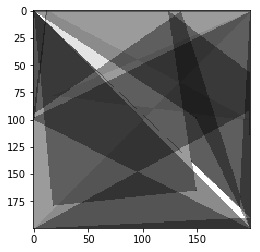

Iteration 17000
improvements 2248


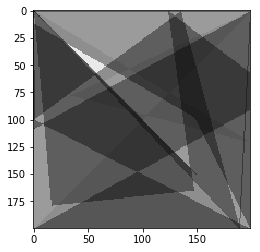

Iteration 18000
improvements 2354


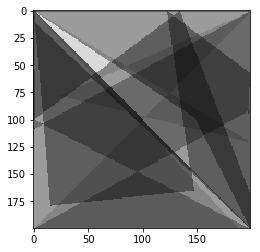

Iteration 19000
improvements 2449


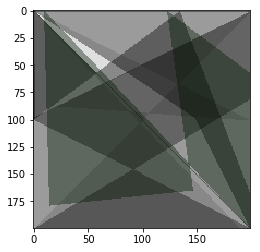

Iteration 20000
improvements 2544


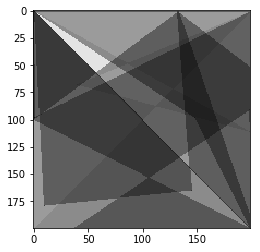

Iteration 21000
improvements 2621


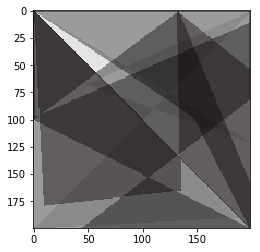

Iteration 22000
improvements 2748


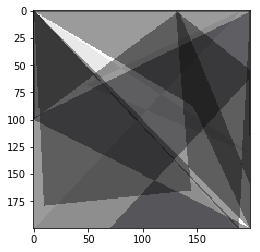

Iteration 23000
improvements 2845


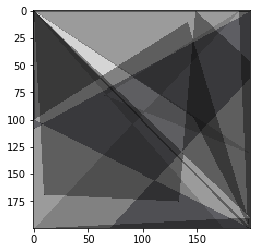

Iteration 24000
improvements 2942


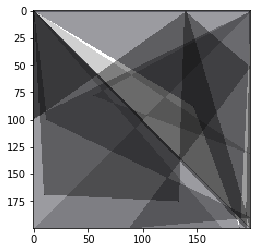

Iteration 25000
improvements 3026


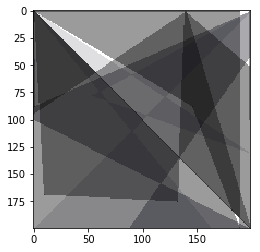

Iteration 26000
improvements 3137


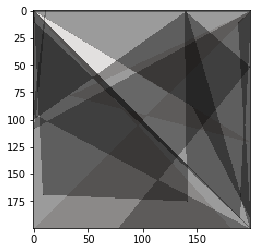

Iteration 27000
improvements 3256


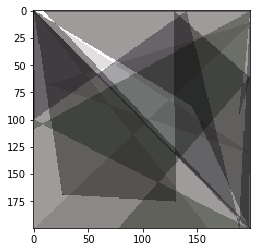

Iteration 28000
improvements 3348


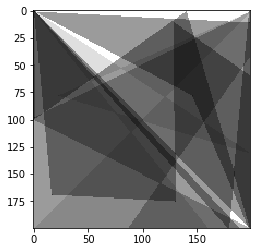

Iteration 29000
improvements 3448


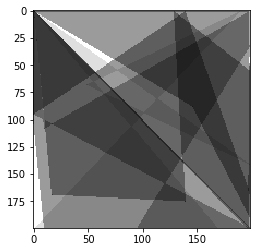

Iteration 30000
improvements 3547


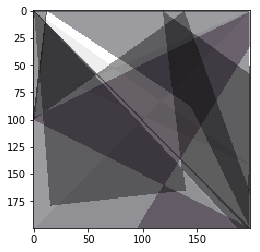

Iteration 31000
improvements 3646


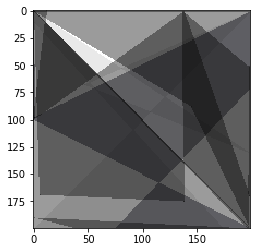

Iteration 32000
improvements 3723


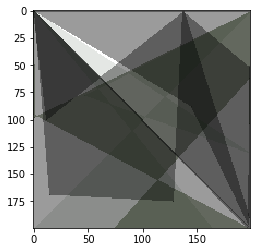

Iteration 33000
improvements 3825


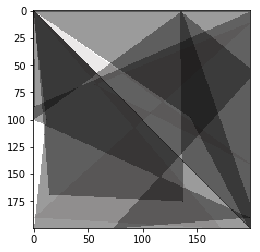

Iteration 34000
improvements 3928


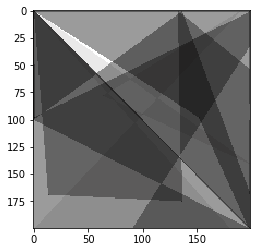

Iteration 35000
improvements 4025


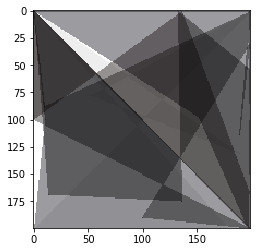

Iteration 36000
improvements 4099


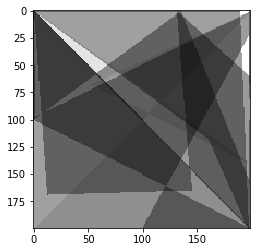

Iteration 37000
improvements 4200


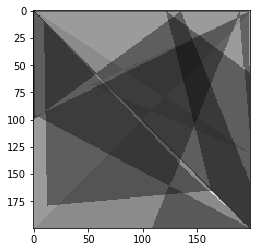

Iteration 38000
improvements 4318


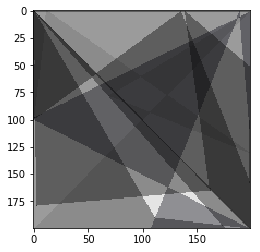

Iteration 39000
improvements 4405


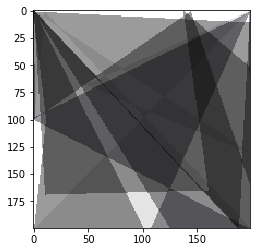

Iteration 40000
improvements 4513


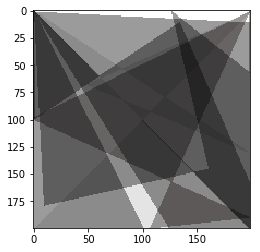

Iteration 41000
improvements 4615


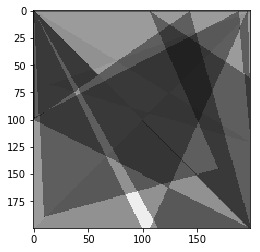

Iteration 42000
improvements 4694


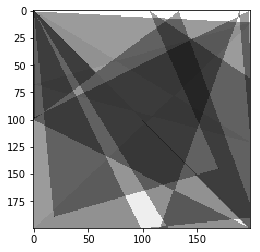

Iteration 43000
improvements 4790


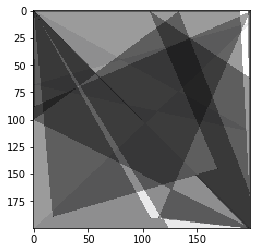

Iteration 44000
improvements 4881


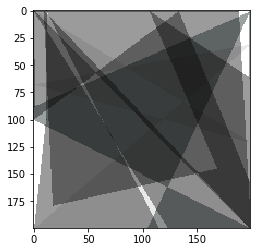

Iteration 45000
improvements 4988


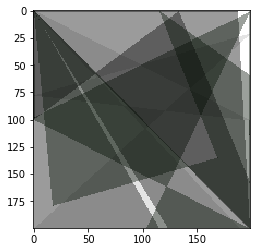

Iteration 46000
improvements 5103


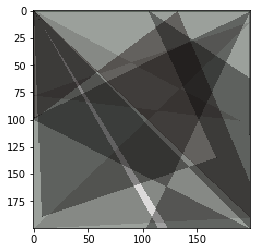

Iteration 47000
improvements 5208


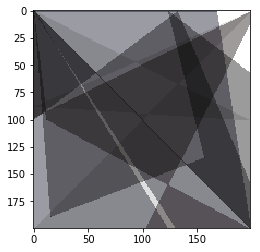

Iteration 48000
improvements 5312


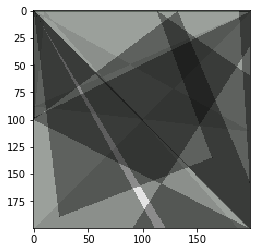

Iteration 49000
improvements 5429


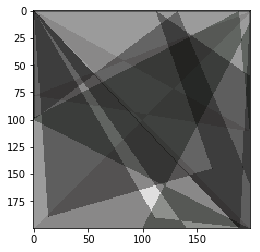

Iteration 50000
improvements 5537


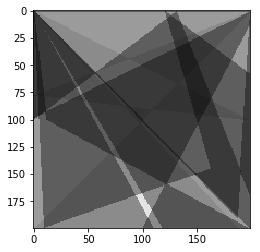

Iteration 51000
improvements 5643


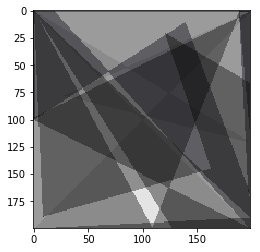

Iteration 52000
improvements 5761


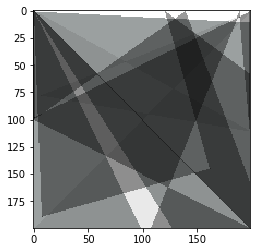

Iteration 53000
improvements 5847


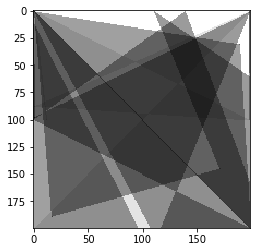

Iteration 54000
improvements 5963


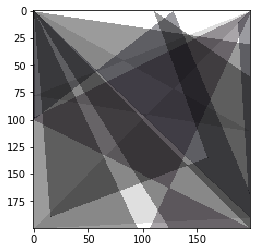

Iteration 55000
improvements 6052


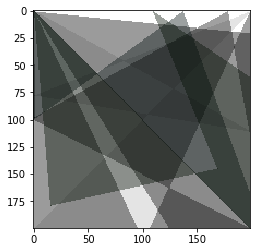

Iteration 56000
improvements 6119


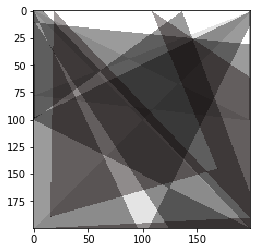

Iteration 57000
improvements 6206


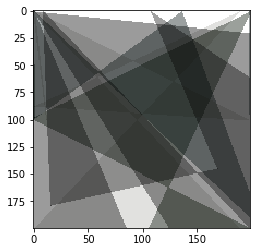

Iteration 58000
improvements 6329


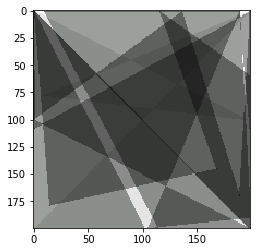

Iteration 59000
improvements 6438


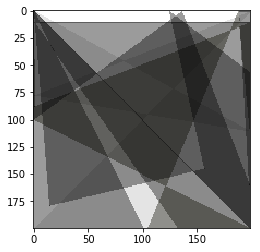

Iteration 60000
improvements 6525


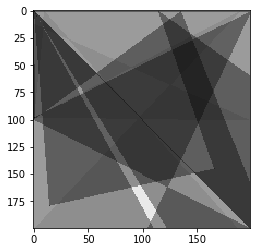

Iteration 61000
improvements 6619


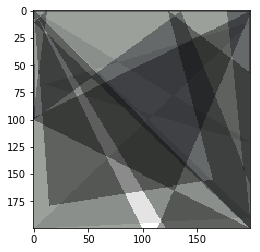

Iteration 62000
improvements 6733


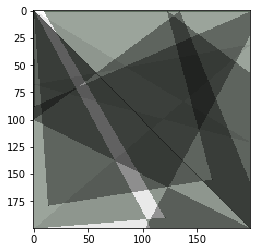

Iteration 63000
improvements 6823


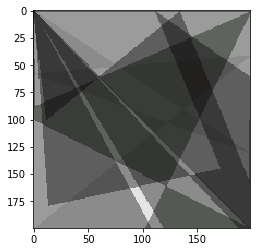

Iteration 64000
improvements 6913


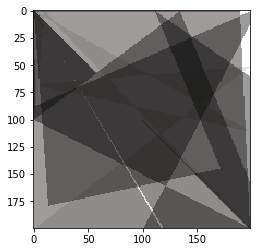

Iteration 65000
improvements 7000


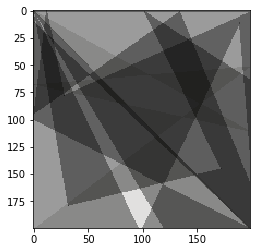

Iteration 66000
improvements 7104


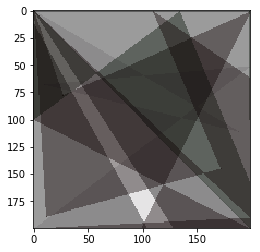

Iteration 67000
improvements 7213


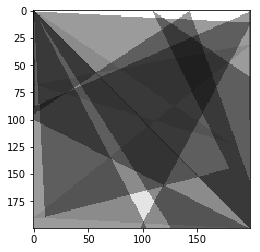

Iteration 68000
improvements 7290


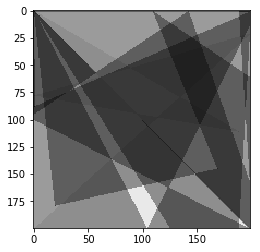

Iteration 69000
improvements 7376


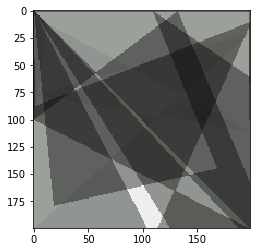

Iteration 70000
improvements 7506


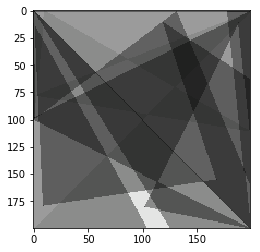

Iteration 71000
improvements 7583


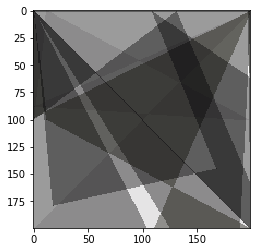

Iteration 72000
improvements 7669


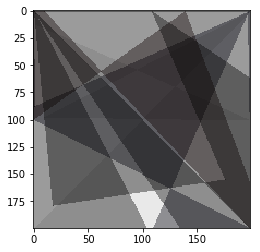

Iteration 73000
improvements 7748


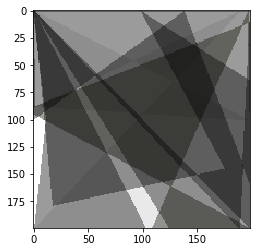

Iteration 74000
improvements 7851


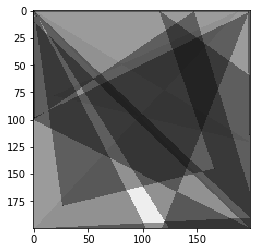

Iteration 75000
improvements 7945


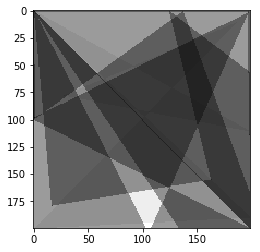

Iteration 76000
improvements 8047


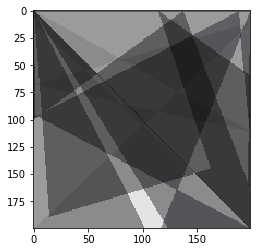

Iteration 77000
improvements 8126


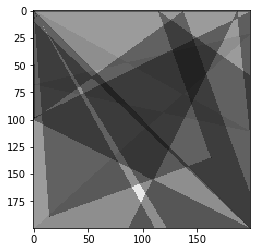

Iteration 78000
improvements 8223


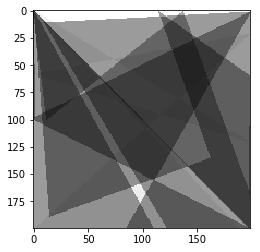

Iteration 79000
improvements 8324


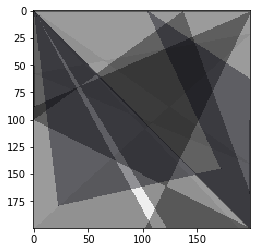

Iteration 80000
improvements 8383


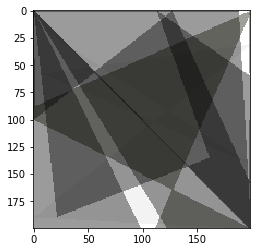

Iteration 81000
improvements 8483


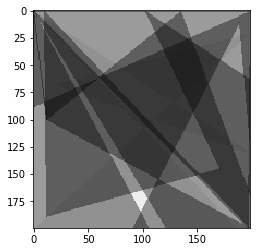

Iteration 82000
improvements 8577


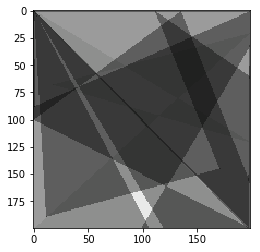

Iteration 83000
improvements 8663


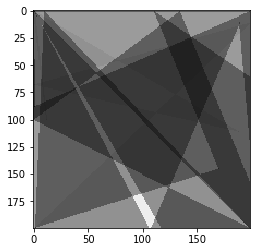

Iteration 84000
improvements 8742


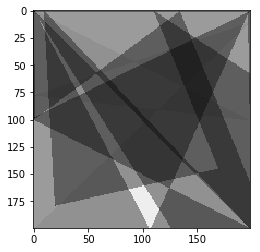

Iteration 85000
improvements 8825


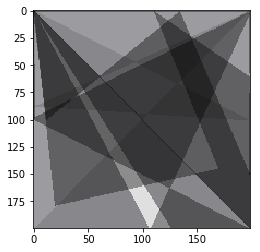

Iteration 86000
improvements 8911


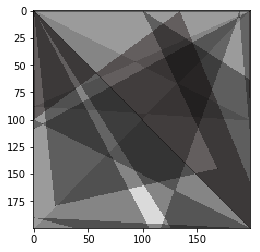

Iteration 87000
improvements 9026


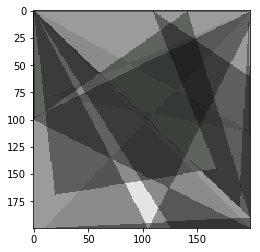

Iteration 88000
improvements 9105


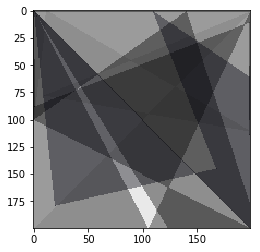

Iteration 89000
improvements 9201


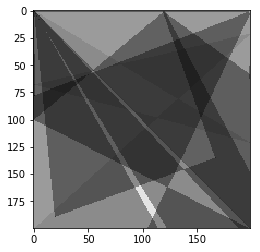

Iteration 90000
improvements 9322


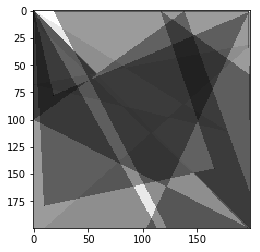

Iteration 91000
improvements 9437


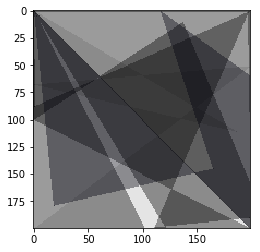

Iteration 92000
improvements 9525


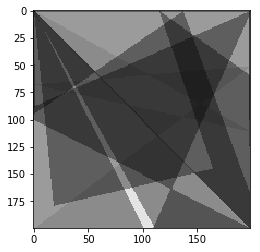

Iteration 93000
improvements 9615


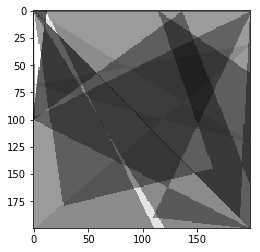

Iteration 94000
improvements 9712


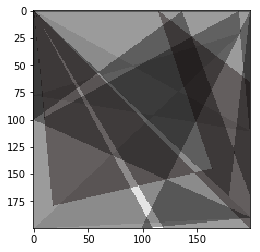

Iteration 95000
improvements 9821


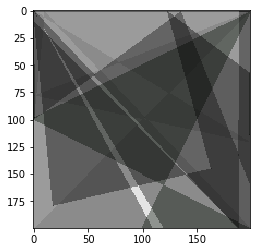

Iteration 96000
improvements 9917


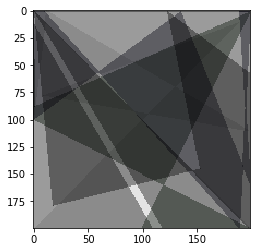

Iteration 97000
improvements 10043


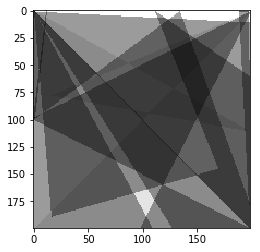

Iteration 98000
improvements 10133


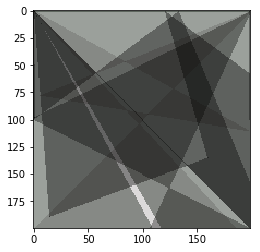

Iteration 99000
improvements 10224


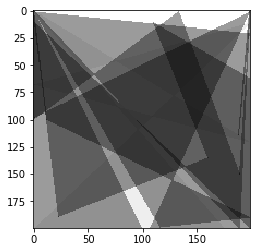

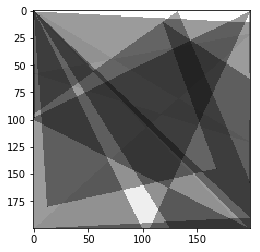

array([  0,   0,   0, 100, 199,  11, 199, 200,  99, 200,   0,   0,   0,
        95,   1, 200, 126, 200,   1,   1,   0,   0,   0, 100, 199, 114,
       198,   1,   1,  98,   0,   0,   0, 100, 198, 200, 107, 200, 198,
         1,   0,   0,   0,  90, 199,   1, 198, 200,   1,   1,   0,   0,
         0,  95, 132,   1, 199, 160, 199,   1,   0,   0,   0, 100,   1,
         1, 199, 190,   1, 200, 255, 255, 255, 100, 119,  11, 168, 145,
        13, 180,   0,   0,   0,  17, 199,  21,   1,  58, 199, 121,   0,
         0,   0, 100,   1,   1, 193, 200,   1, 200])

In [88]:
orig_mat = np.array(darwin)
hill(orig_mat, 10, 3, 100000, mut_rate=0.05)

Iteration 0
improvements 1


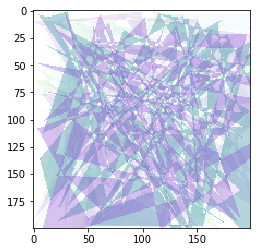

Iteration 1000
improvements 481


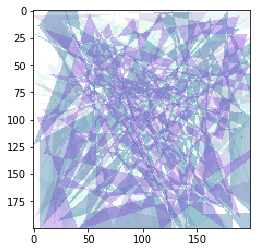

Iteration 2000
improvements 944


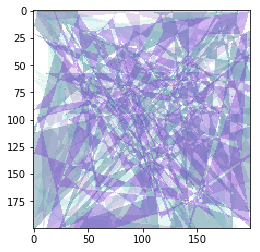

Iteration 3000
improvements 1378


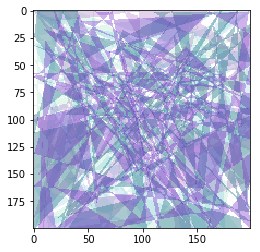

Iteration 4000
improvements 1762


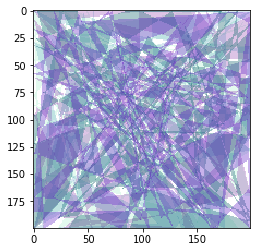

Iteration 5000
improvements 2174


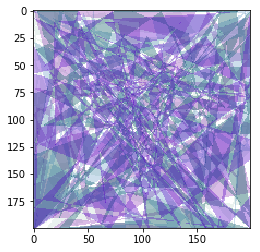

Iteration 6000
improvements 2498


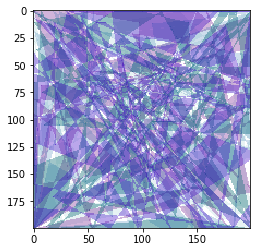

Iteration 7000
improvements 2836


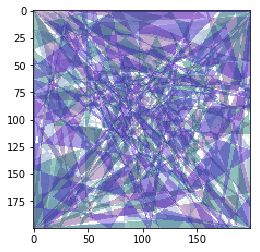

Iteration 8000
improvements 3184


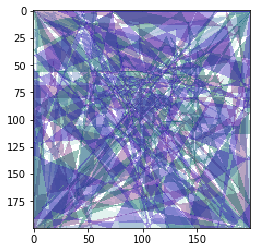

Iteration 9000
improvements 3469


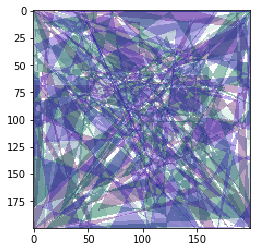

Iteration 10000
improvements 3767


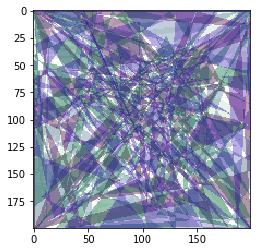

Iteration 11000
improvements 4034


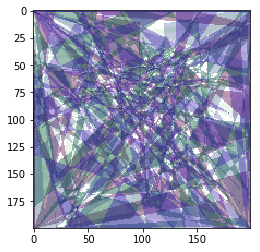

Iteration 12000
improvements 4305


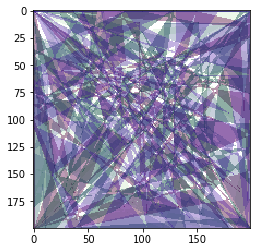

Iteration 13000
improvements 4557


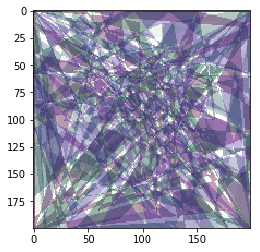

Iteration 14000
improvements 4822


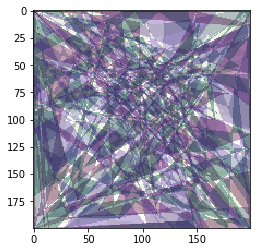

Iteration 15000
improvements 5072


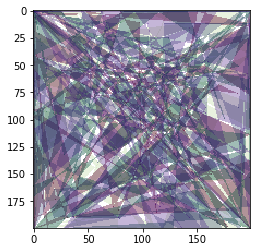

Iteration 16000
improvements 5330


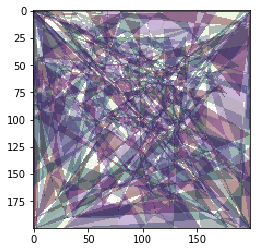

Iteration 17000
improvements 5595


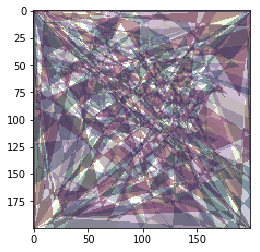

Iteration 18000
improvements 5853


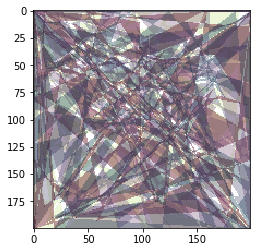

Iteration 19000
improvements 6083


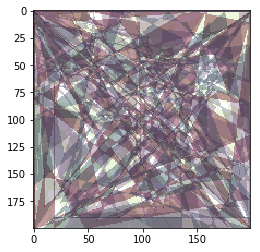

Iteration 20000
improvements 6289


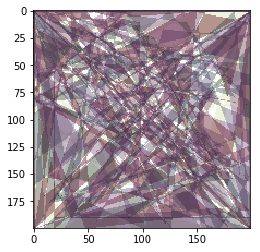

Iteration 21000
improvements 6521


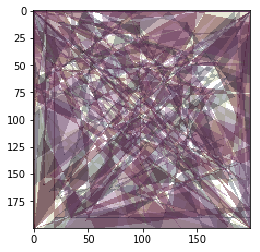

Iteration 22000
improvements 6752


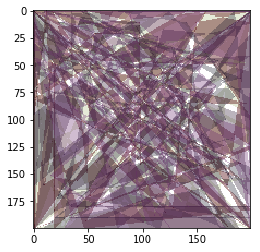

Iteration 23000
improvements 6974


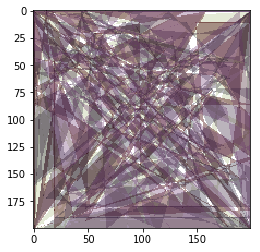

Iteration 24000
improvements 7192


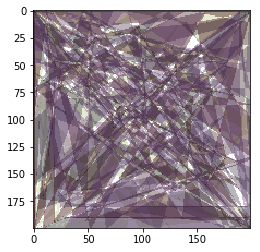

Iteration 25000
improvements 7399


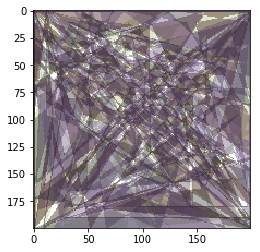

Iteration 26000
improvements 7616


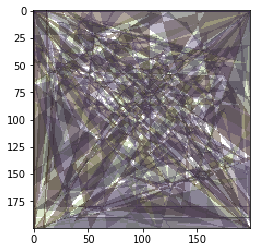

Iteration 27000
improvements 7844


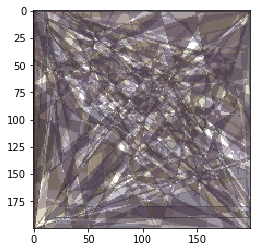

Iteration 28000
improvements 8064


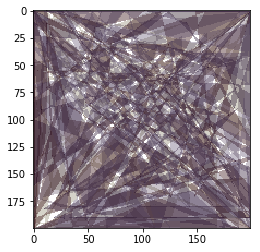

Iteration 29000
improvements 8269


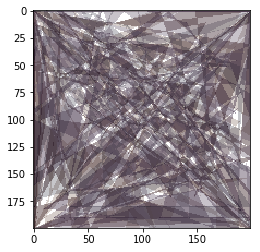

Iteration 30000
improvements 8469


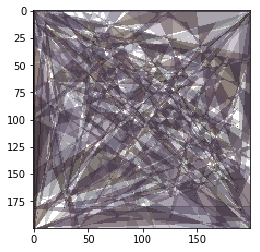

Iteration 31000
improvements 8659


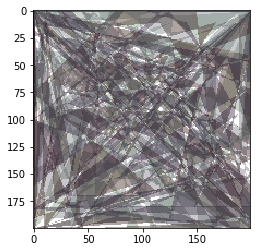

Iteration 32000
improvements 8865


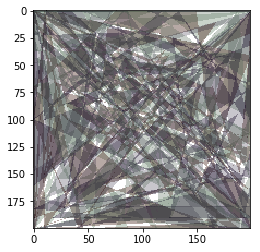

Iteration 33000
improvements 9077


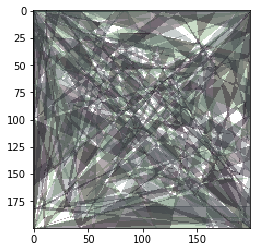

Iteration 34000
improvements 9265


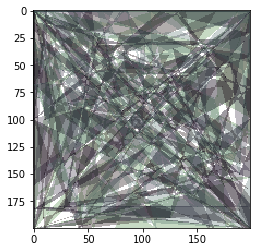

Iteration 35000
improvements 9444


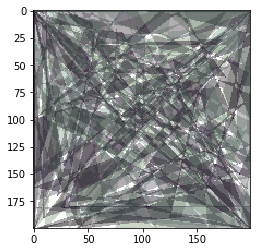

Iteration 36000
improvements 9661


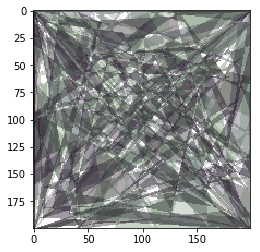

Iteration 37000
improvements 9844


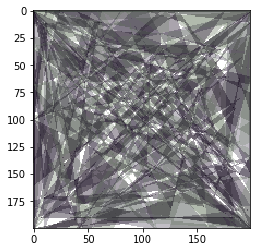

Iteration 38000
improvements 10036


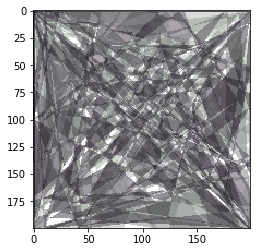

Iteration 39000
improvements 10237


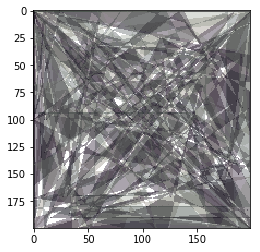

Iteration 40000
improvements 10429


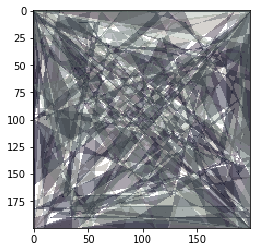

Iteration 41000
improvements 10615


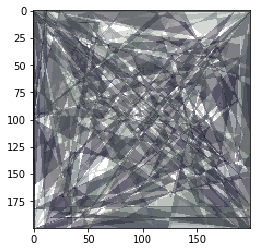

Iteration 42000
improvements 10820


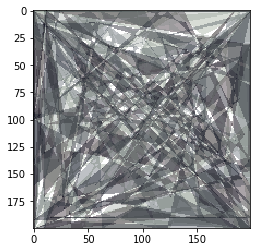

Iteration 43000
improvements 11030


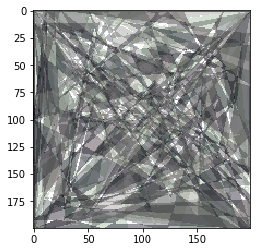

Iteration 44000
improvements 11244


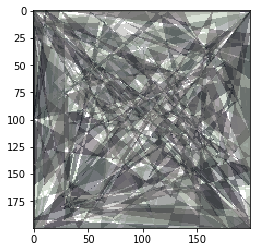

Iteration 45000
improvements 11451


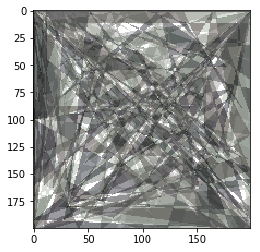

Iteration 46000
improvements 11663


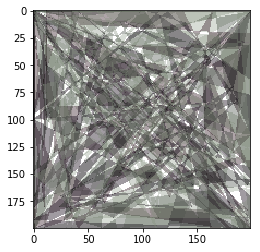

Iteration 47000
improvements 11882


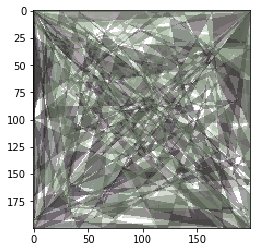

Iteration 48000
improvements 12084


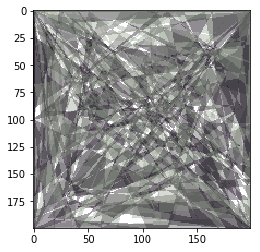

KeyboardInterrupt: 

In [99]:
hill(orig_mat, 50, 6, 100000, mut_rate=0.05)

Iteration 0
improvements 1


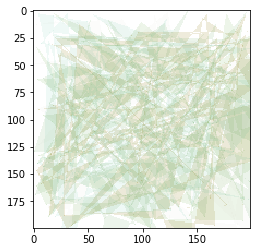

Iteration 1000
improvements 355


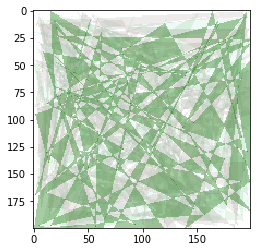

Iteration 2000
improvements 641


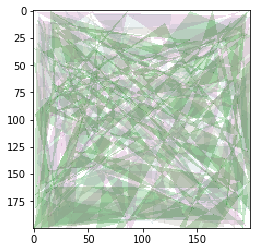

Iteration 3000
improvements 853


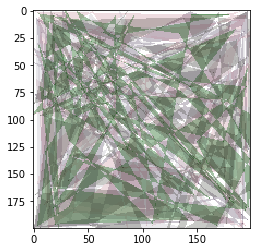

Iteration 4000
improvements 1038


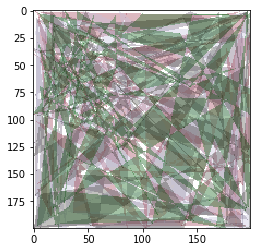

Iteration 5000
improvements 1194


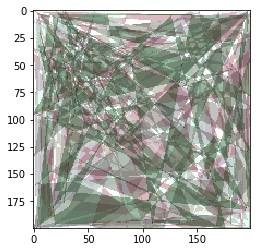

Iteration 6000
improvements 1329


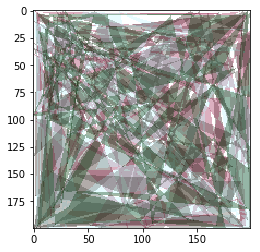

Iteration 7000
improvements 1426


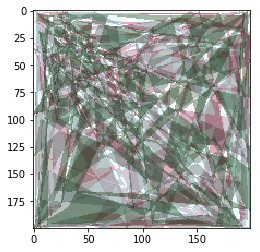

Iteration 8000
improvements 1536


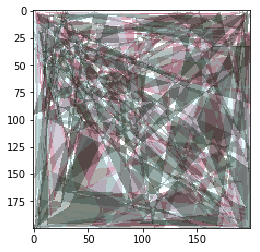

Iteration 9000
improvements 1640


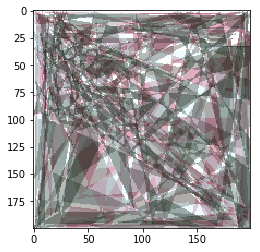

Iteration 10000
improvements 1726


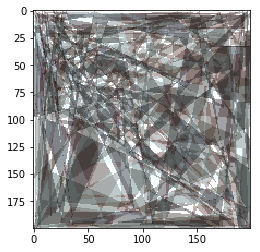

Iteration 11000
improvements 1783


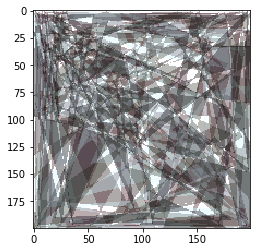

Iteration 12000
improvements 1851


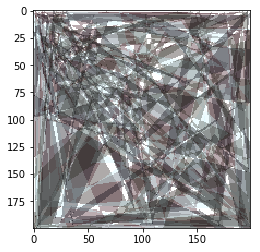

Iteration 13000
improvements 1932


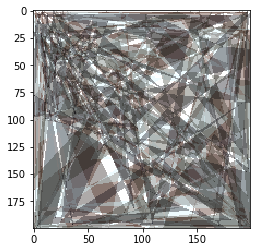

Iteration 14000
improvements 2005


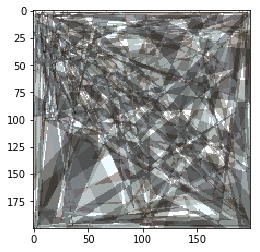

KeyboardInterrupt: 

In [119]:
hill(orig_mat, 50, 6, 100000, mut_random = True, mut_change = 0.0)

Iteration 0
improvements 1
Fit:  0.46920161837


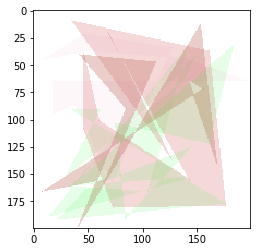

Iteration 1000
improvements 220
Fit:  0.13483204746


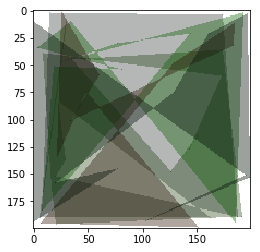

Iteration 2000
improvements 311
Fit:  0.084826004043


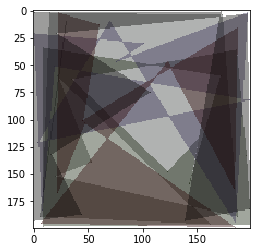

Iteration 3000
improvements 372
Fit:  0.0699929643089


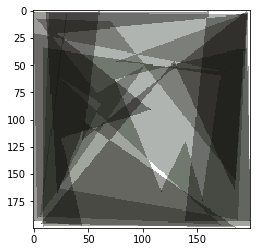

Iteration 4000
improvements 405
Fit:  0.063371272098


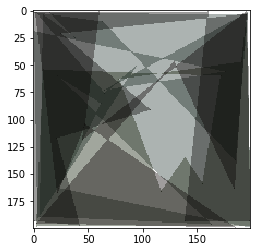

Iteration 5000
improvements 443
Fit:  0.0522467266488


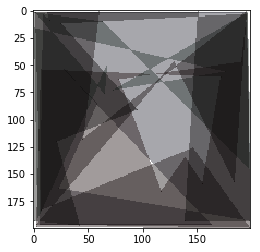

Iteration 6000
improvements 468
Fit:  0.0508399994333


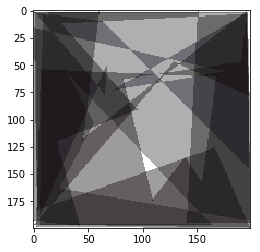

Iteration 7000
improvements 488
Fit:  0.0493510569637


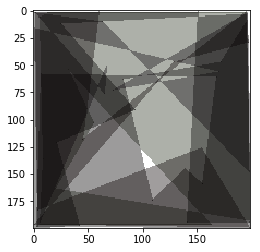

Iteration 8000
improvements 506
Fit:  0.0467147162185


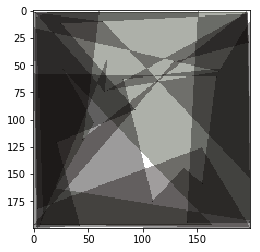

Iteration 9000
improvements 521
Fit:  0.0455964480869


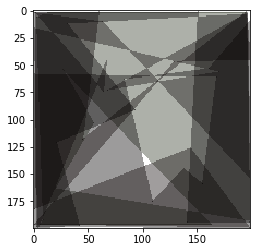

Iteration 10000
improvements 537
Fit:  0.0445506567826


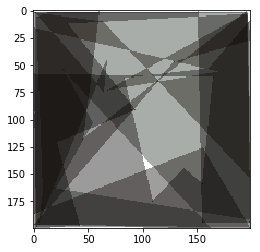

Iteration 11000
improvements 554
Fit:  0.0413444588056


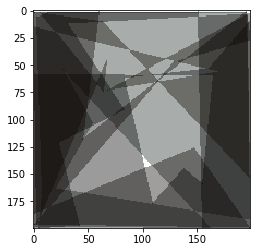

Iteration 12000
improvements 565
Fit:  0.0411306633127


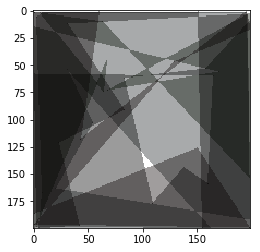

Iteration 13000
improvements 577
Fit:  0.039460740071


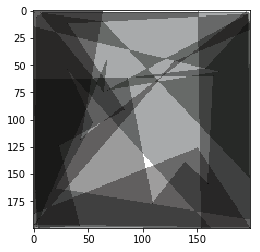

Iteration 14000
improvements 587
Fit:  0.0391944021015


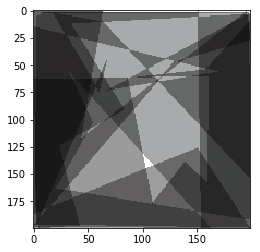

Iteration 15000
improvements 600
Fit:  0.0388919934802


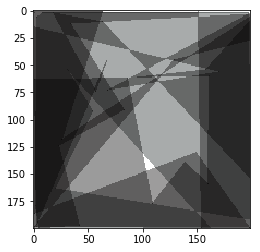

Iteration 16000
improvements 619
Fit:  0.0384409370961


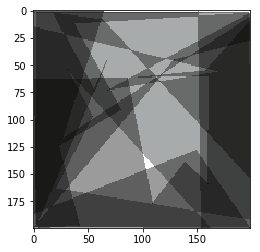

Iteration 17000
improvements 626
Fit:  0.0383939458925


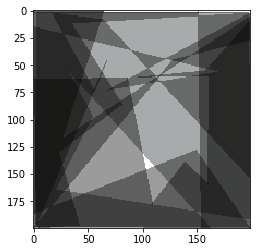

Iteration 18000
improvements 635
Fit:  0.0383211877663


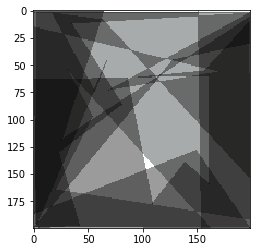

Iteration 19000
improvements 643
Fit:  0.0370116097597


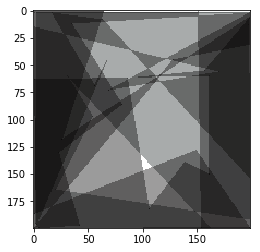

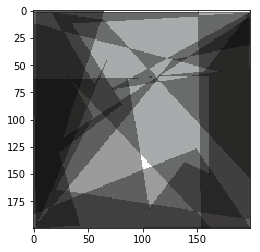

array([  0,   8,   8,  87,   3,   2, 198,   2, 197,   3, 199, 192,  20,
       164,  54,  97,  31,  60, 163, 200,   5, 199,   2, 196,   0,   1,
         1, 100,   1,  63,   3, 198, 199, 200, 198,   3, 157,  56,  86,
        63, 106, 182, 139, 139, 161, 150, 161,  60,   3,   5,   0,  97,
       198,   2, 199, 154,  63,   8,  17,   2,  56,  69,  67,  46,   1,
       200,   1,  12, 170,  56,  70,  73,   3,   0,   0,  99,   1, 199,
       128,  45, 199,  31, 198,   6,  26, 118,  64,   1,   1,   1,   1,
       186, 149, 127, 198, 199,   3,   0,   1, 100, 151,   1,   1,   2,
         1, 200,  42, 197,  23, 130,  81,  86,  35,  12, 199,   2, 198,
       199, 154, 199])

In [137]:
hill(orig_mat, 5, 10, 20000, mut_random=True, mut_change=-1)

Iteration 0
improvements 1
Fit:  0.338348209714


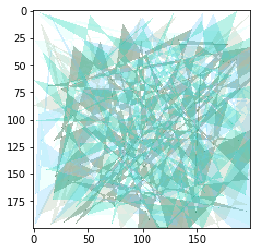

Iteration 1000
improvements 380
Fit:  0.19911038468


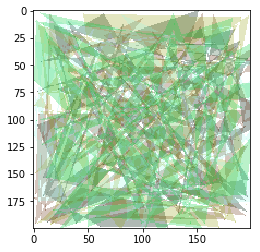

Iteration 2000
improvements 659
Fit:  0.12271154697


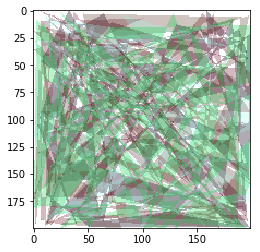

Iteration 3000
improvements 904
Fit:  0.0843600050747


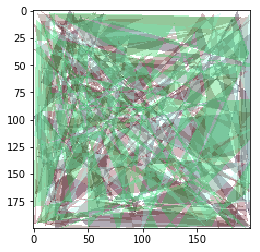

Iteration 4000
improvements 1106
Fit:  0.0638602557836


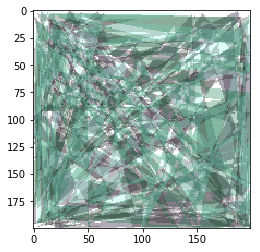

Iteration 5000
improvements 1276
Fit:  0.0520275264571


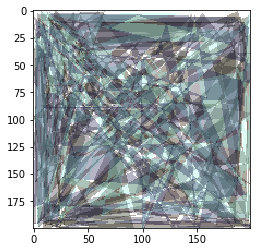

Iteration 6000
improvements 1415
Fit:  0.0477263943709


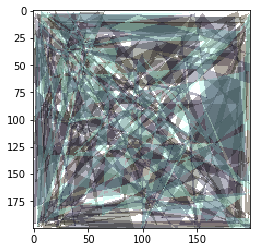

Iteration 7000
improvements 1553
Fit:  0.041797791598


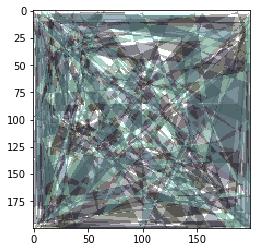

Iteration 8000
improvements 1686
Fit:  0.037492866099


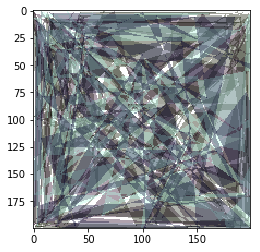

Iteration 9000
improvements 1792
Fit:  0.0350514724075


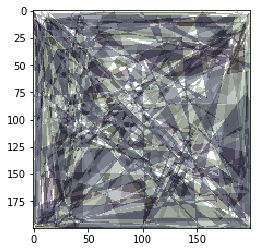

Iteration 10000
improvements 1904
Fit:  0.0331768274926


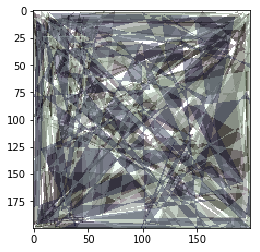

Iteration 11000
improvements 1983
Fit:  0.0322710277003


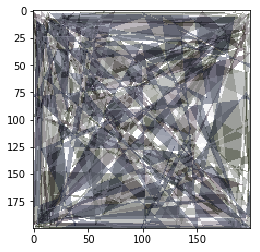

Iteration 12000
improvements 2052
Fit:  0.0296888547569


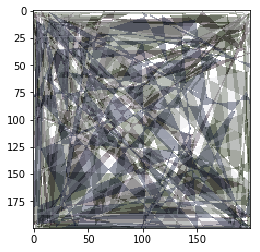

Iteration 13000
improvements 2137
Fit:  0.0284035861739


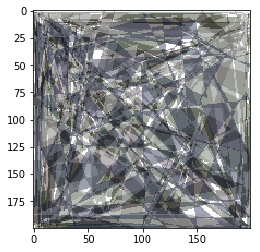

Iteration 14000
improvements 2220
Fit:  0.0272103884796


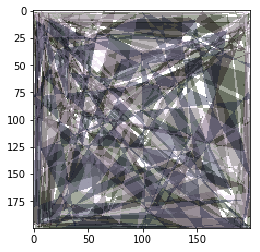

Iteration 15000
improvements 2293
Fit:  0.0262856974865


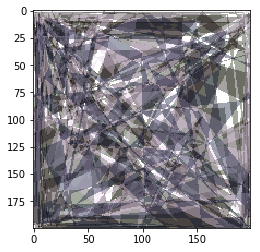

Iteration 16000
improvements 2383
Fit:  0.0254771250846


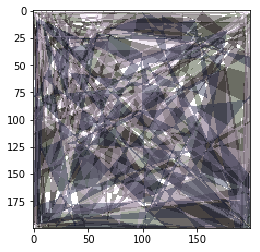

Iteration 17000
improvements 2467
Fit:  0.0248529870936


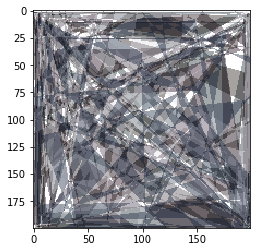

Iteration 18000
improvements 2528
Fit:  0.0236531504118


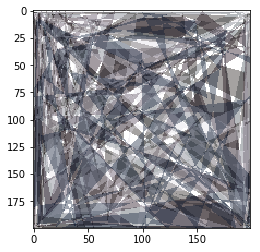

Iteration 19000
improvements 2589
Fit:  0.0231257493413


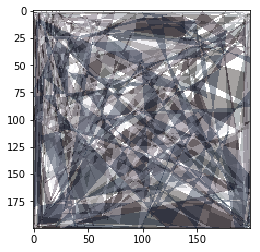

Iteration 20000
improvements 2660
Fit:  0.0207465435598


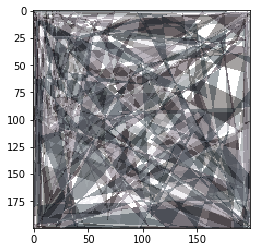

Iteration 21000
improvements 2706
Fit:  0.019823661174


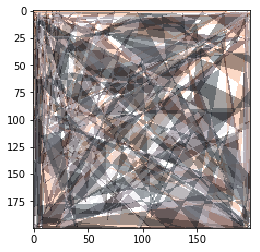

Iteration 22000
improvements 2773
Fit:  0.0194078023077


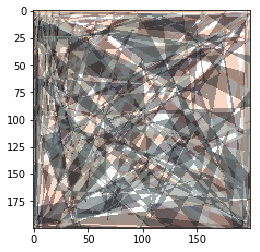

Iteration 23000
improvements 2833
Fit:  0.0188861504756


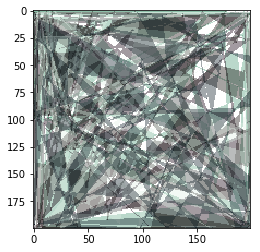

Iteration 24000
improvements 2888
Fit:  0.0182814248096


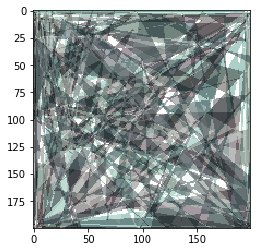

Iteration 25000
improvements 2931
Fit:  0.0179135004769


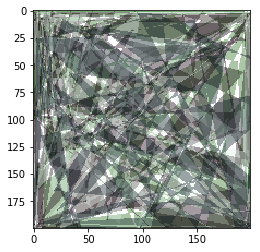

Iteration 26000
improvements 2985
Fit:  0.017541633066


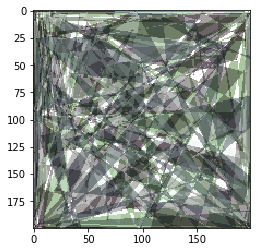

Iteration 27000
improvements 3031
Fit:  0.0173458302663


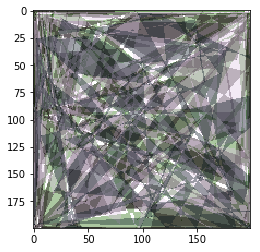

Iteration 28000
improvements 3075
Fit:  0.0171348949026


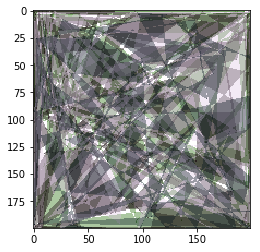

Iteration 29000
improvements 3114
Fit:  0.0170276713569


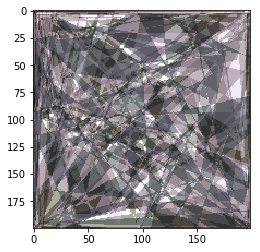

Iteration 30000
improvements 3168
Fit:  0.0167896993619


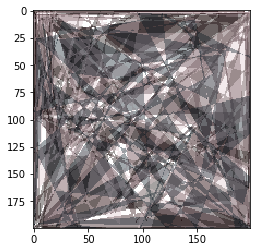

Iteration 31000
improvements 3210
Fit:  0.0164113802384


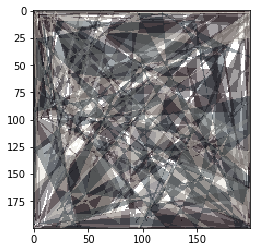

Iteration 32000
improvements 3253
Fit:  0.0162551773348


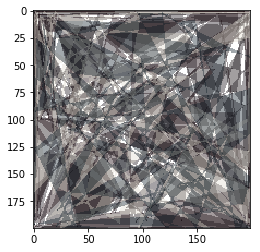

Iteration 33000
improvements 3289
Fit:  0.016146216537


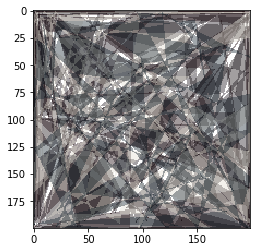

Iteration 34000
improvements 3319
Fit:  0.0160146225167


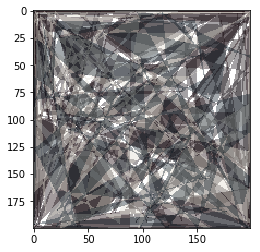

Iteration 35000
improvements 3360
Fit:  0.0158914401561


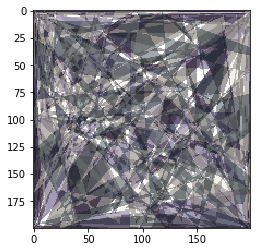

Iteration 36000
improvements 3393
Fit:  0.0157616583494


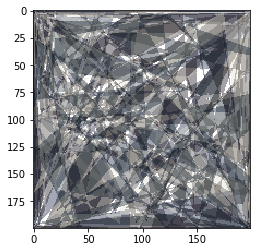

Iteration 37000
improvements 3421
Fit:  0.0156748690267


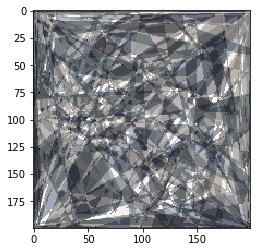

Iteration 38000
improvements 3446
Fit:  0.015552041252


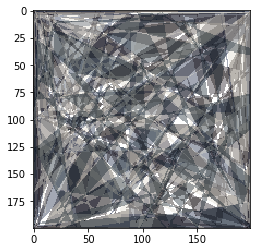

Iteration 39000
improvements 3477
Fit:  0.0154559054403


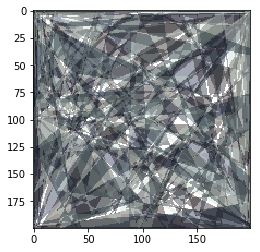

Iteration 40000
improvements 3510
Fit:  0.0153654466102


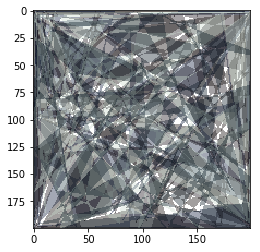

Iteration 41000
improvements 3534
Fit:  0.0152706464528


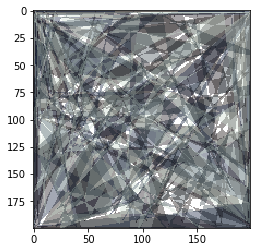

Iteration 42000
improvements 3569
Fit:  0.0151823238968


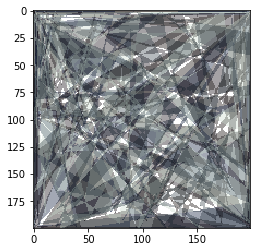

Iteration 43000
improvements 3596
Fit:  0.0151094672388


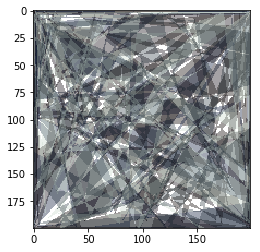

Iteration 44000
improvements 3623
Fit:  0.0150432896251


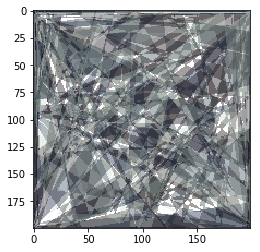

Iteration 45000
improvements 3648
Fit:  0.0149929039018


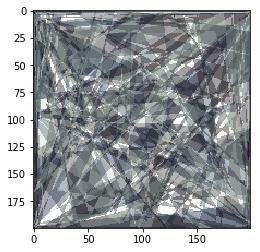

Iteration 46000
improvements 3675
Fit:  0.0149448968539


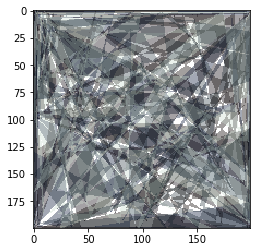

Iteration 47000
improvements 3706
Fit:  0.0148464484411


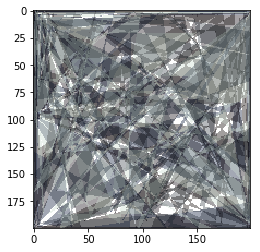

Iteration 48000
improvements 3732
Fit:  0.0147502479719


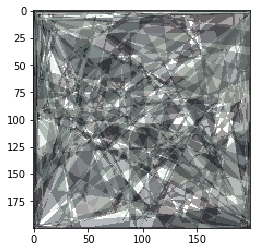

Iteration 49000
improvements 3753
Fit:  0.0147003045472


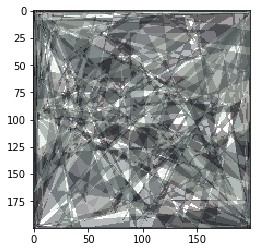

Iteration 50000
improvements 3788
Fit:  0.0146254684933


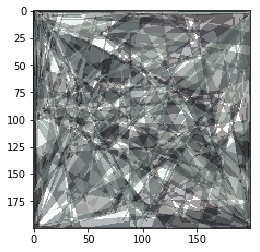

Iteration 51000
improvements 3803
Fit:  0.0145945955589


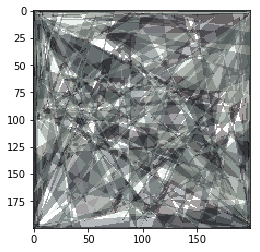

Iteration 52000
improvements 3819
Fit:  0.014541837085


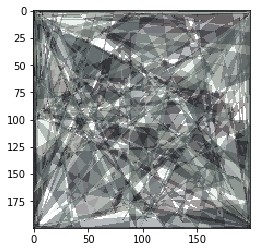

Iteration 53000
improvements 3833
Fit:  0.0144919455666


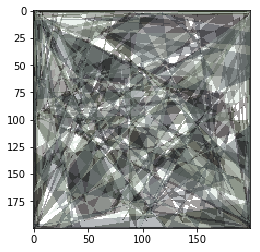

Iteration 54000
improvements 3856
Fit:  0.0144482835812


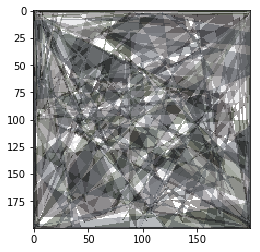

Iteration 55000
improvements 3885
Fit:  0.0143859829714


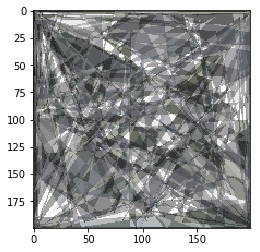

Iteration 56000
improvements 3912
Fit:  0.0143261862304


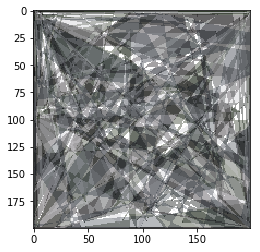

Iteration 57000
improvements 3933
Fit:  0.0142437344997


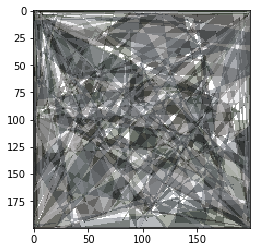

Iteration 58000
improvements 3954
Fit:  0.0141919534878


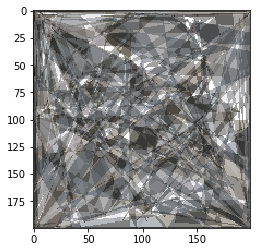

Iteration 59000
improvements 3978
Fit:  0.0141417138235


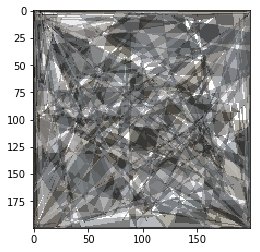

Iteration 60000
improvements 3996
Fit:  0.014093721974


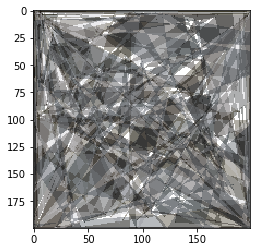

Iteration 61000
improvements 4010
Fit:  0.0140638824006


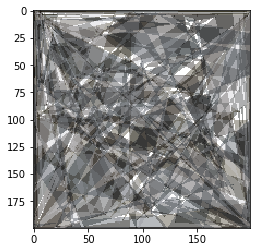

Iteration 62000
improvements 4030
Fit:  0.0140134695005


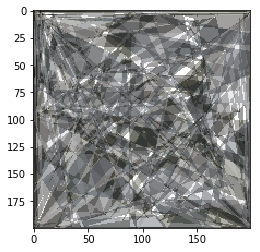

Iteration 63000
improvements 4038
Fit:  0.014006336952


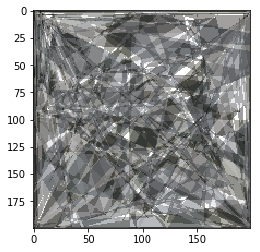

Iteration 64000
improvements 4051
Fit:  0.0139893385935


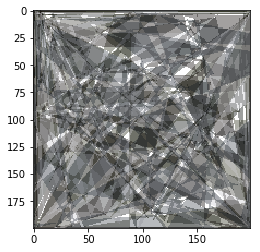

Iteration 65000
improvements 4066
Fit:  0.0139622008543


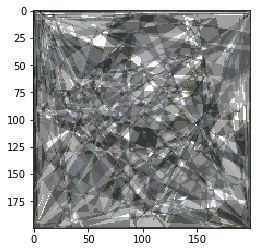

Iteration 66000
improvements 4085
Fit:  0.0139366888267


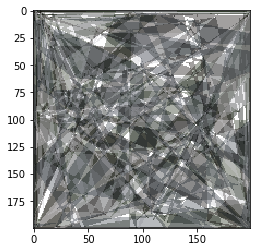

Iteration 67000
improvements 4097
Fit:  0.0139283200573


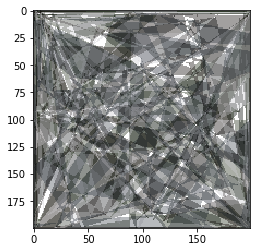

Iteration 68000
improvements 4117
Fit:  0.0139121202578


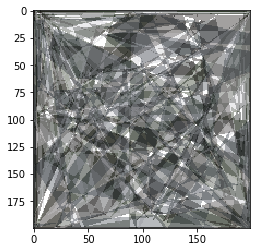

Iteration 69000
improvements 4136
Fit:  0.0138609761611


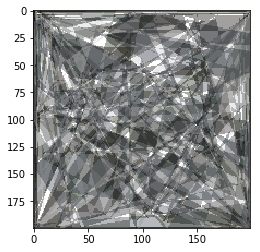

Iteration 70000
improvements 4150
Fit:  0.0138266504894


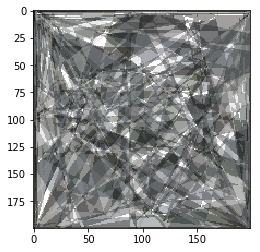

Iteration 71000
improvements 4166
Fit:  0.0137920802268


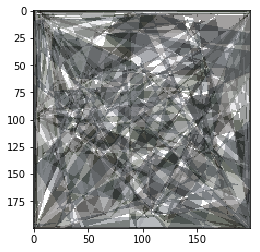

Iteration 72000
improvements 4178
Fit:  0.0137837408238


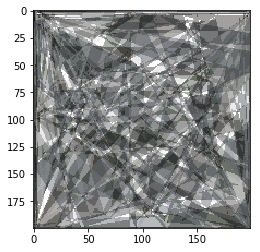

Iteration 73000
improvements 4190
Fit:  0.013763092278


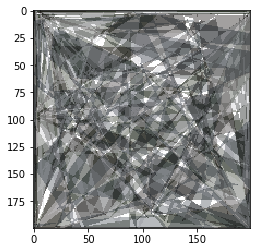

Iteration 74000
improvements 4204
Fit:  0.0137415769093


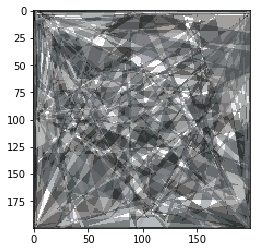

Iteration 75000
improvements 4219
Fit:  0.0137155221191


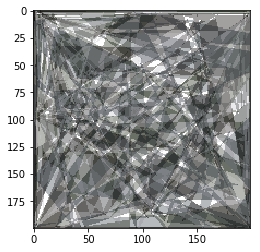

Iteration 76000
improvements 4233
Fit:  0.0136999323157


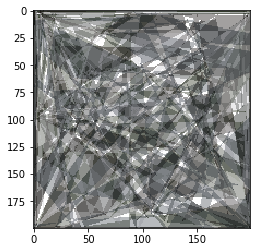

Iteration 77000
improvements 4250
Fit:  0.0136787898225


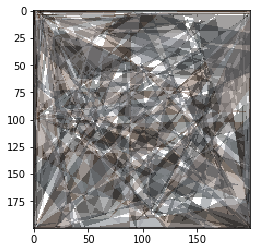

Iteration 78000
improvements 4269
Fit:  0.0136329052671


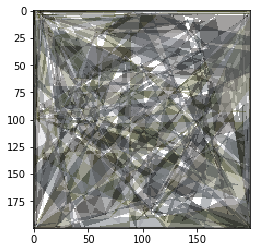

Iteration 79000
improvements 4281
Fit:  0.0136287358876


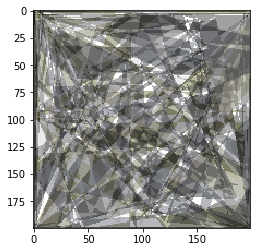

Iteration 80000
improvements 4293
Fit:  0.0136049115242


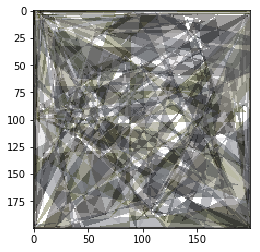

Iteration 81000
improvements 4304
Fit:  0.0135963467214


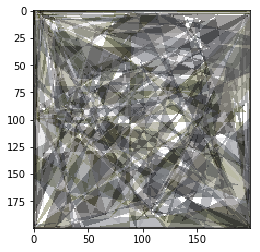

Iteration 82000
improvements 4317
Fit:  0.0135629992845


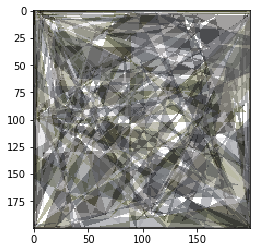

Iteration 83000
improvements 4329
Fit:  0.0135552765751


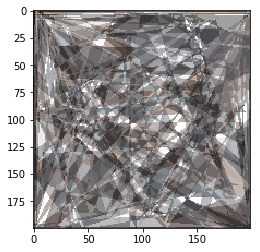

Iteration 84000
improvements 4341
Fit:  0.0135458636254


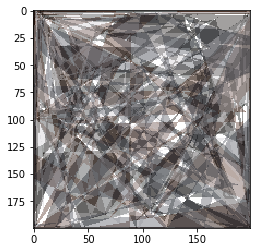

Iteration 85000
improvements 4357
Fit:  0.0135283893516


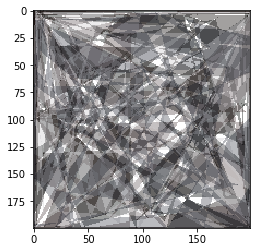

Iteration 86000
improvements 4368
Fit:  0.0134985851982


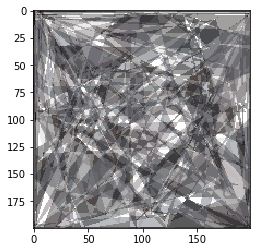

Iteration 87000
improvements 4376
Fit:  0.0134897155262


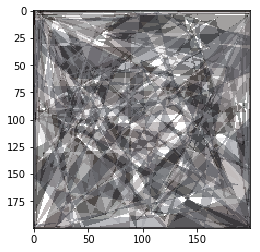

Iteration 88000
improvements 4391
Fit:  0.0134718554969


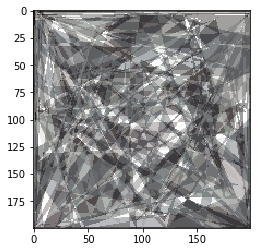

Iteration 89000
improvements 4400
Fit:  0.0134642320922


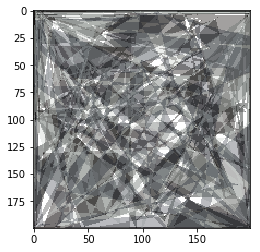

Iteration 90000
improvements 4409
Fit:  0.0134529918592


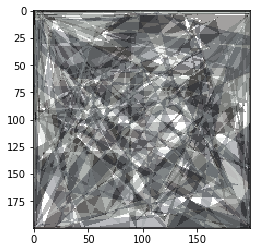

Iteration 91000
improvements 4419
Fit:  0.0134403359873


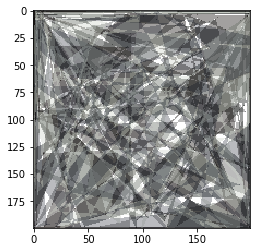

Iteration 92000
improvements 4432
Fit:  0.0133133915122


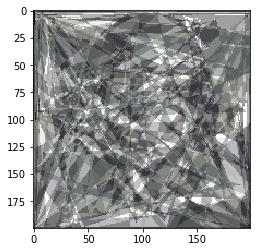

Iteration 93000
improvements 4443
Fit:  0.013300924332


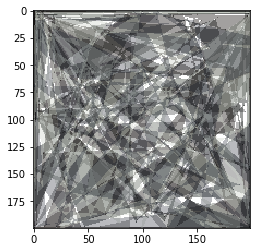

Iteration 94000
improvements 4455
Fit:  0.0132882326537


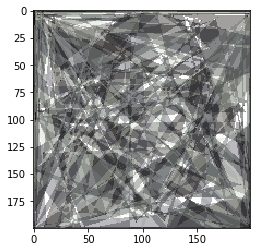

Iteration 95000
improvements 4462
Fit:  0.0132829132205


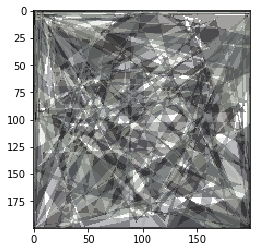

Iteration 96000
improvements 4470
Fit:  0.0132716624259


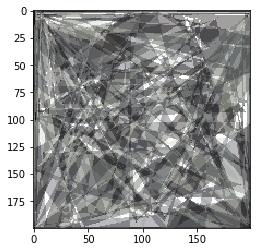

Iteration 97000
improvements 4480
Fit:  0.0132607461246


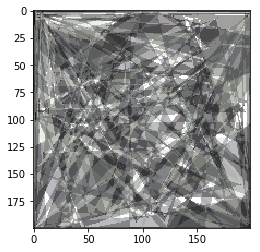

Iteration 98000
improvements 4492
Fit:  0.0132519891525


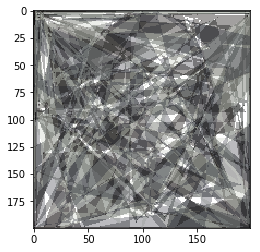

Iteration 99000
improvements 4496
Fit:  0.0132436565758


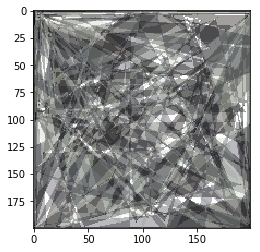

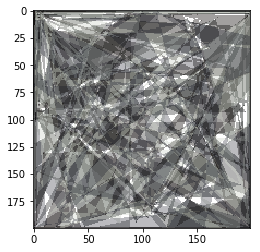

array([  0,   5,   2,  98, 141, 153,  95, 192, 193,  87, 192,  62, 113,
       176, 199,  15,   7,   5,   0,  74, 120, 189, 173, 149,   2,   4,
        42,   4, 199, 146, 167,   8,  25,  54,  49,  94, 100,   1, 176,
        17, 199, 173, 137, 171, 198, 199, 194,   1,   6,   3,   2, 100,
        86,  35,   2, 145, 199,   3, 124,   3, 161,  33,   1, 122,   0,
         1,  11,  91, 108, 150, 199,  37, 193,  26,  76, 114,  84,  49,
        94, 194,   1,   3,   0,  99, 141,   7, 199, 148, 112,  98, 199,
         1, 198, 146, 183,  52,   9,   0,   2,  92, 199,  84, 198, 200,
       123, 198, 140, 129, 198,   1, 128,   5,   3,   2,   0,  99,   4,
        99,  47, 198, 172, 158, 141,  68, 198, 199,   2, 200, 244, 253,
       219,  93,   8,   4,  36,  14,  69, 102, 192,  25, 192, 123,  54,
        55,  18,  30,   5,  83, 120, 193, 198,   1,   1,   1,   1, 185,
        66,  52, 162,  66,   6,   8,   7,  78, 108, 180,  61, 137, 196,
        10,  71, 189, 155,  97,  51, 163,   1,   1,   2, 100,  2

In [140]:
hill(orig_mat, 50, 6, 100000, mut_random=True, mut_change=-1)

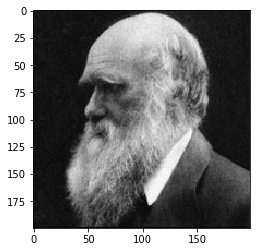

In [136]:
plt.imshow(orig_mat)
plt.show()

### Voronoi stuff

In [158]:
def get_bounds_voronoi(nr_points, size, rgb_range = [0,255]):
    
    w_range = [1, size[0]]
    h_range = [1, size[1]]

    point = 3*[rgb_range] + [w_range, h_range]  # R; G, B, x, y
    bounds = nr_points*point

    return bounds

bounds_v = get_bounds_voronoi(nr_points=5, size = size)

In [155]:
def popul_from_bounds_voronoi(bounds, popsize, nr_params = 5):
    
    population = []
    
    nr_points = len(bounds_v)//nr_params  # 5 - RGB and then X,Y
    
    for i in range(0, popsize):
        indv = []

        for j in range(nr_points):
            point = []
            for k in range(nr_params):
                point.append(randint(bounds[k][0],bounds[k][1]))
            indv.append(point)
        population.append(indv)
        
    return population

popul_from_bounds_voronoi(bounds=bounds_v, popsize=1)

[[[213, 178, 191, 157, 118],
  [74, 22, 111, 30, 112],
  [51, 18, 226, 137, 155],
  [201, 34, 121, 54, 114],
  [175, 73, 27, 67, 86]]]

In [ ]:
def hill_voronoi(orig_img, nr_points, iter = 10, mut_rate = 0.05, mut_change = 0.05, mut_random = False):
    
    # Get params
    size = tuple(reversed(orig_img.shape[:2])) # W and H of image
    bounds_v = get_bounds_voronoi(nr_points=nr_points, size = size)
    
    # Init DNA
    dna = popul_from_bounds_voronoi(bounds=bounds_v, popsize=1)[0]  # Only one element in pop, take 1st
    dna = np.array(dna).flatten()
    #print(dna)
    
    cost_last = cost_voronoi(nr_points=nr_points, orig_mat=orig_img, params=dna)
        
    len_dna = len(dna)
    dna_last = dna
    dna_new = dna_last.copy()
    
    impr = 0
    
    for i in range(iter):    
        
        # Select randomly param to change and change it by mutation rate
        idx = randint(0, len_dna - 1)
        direction = choice([-1,1])  # Select randomly the direction
        limits = bounds[idx]  # limits 
        
        if mut_random:
            dna_new[idx] = randint(limits[0], limits[1])
        else:
            #Mutate
            dna_new[idx] = dna_last[idx] + direction*limits[1]*mut_rate
        
        # Quick limits check
        if dna_new[idx] > limits[1]:
            dna_new[idx] = limits[1]
        elif dna_new[idx] < limits[0]:
            dna_new[idx] = limits[0]
        
        # Calculate new cost
        cost_new = cost_poly(nr_poly=nr_poly, orig_mat=orig_img, params=dna_new)
        
        mut = random()
        
        # Compare costs
        if (mut < mut_change)  or (cost_new < cost_last):
            dna_last = dna_new.copy()
            cost_last = cost_new
            impr += 1
        else:
            dna_new = dna_last.copy()
            
        if i % 1000 == 0:
            print("Iteration", i)
            print("improvements", impr)
            fit = cost_last/(255*255*3*size[0]*size[1])
            print("Fit: ", fit)
            show_img(size, dna_last)
        
    
    show_img(size, dna_last)
    return dna_last